In [1]:
%matplotlib inline 
import skimage.io
import numpy as np
import matplotlib.pyplot as plt
import scipy
import scipy.signal
import cv2
from scipy.interpolate import interpn
from tqdm.auto import tqdm
from mpl_toolkits.axes_grid1 import ImageGrid
import matplotlib.transforms as mtransforms

/Users/prachigarg/opt/anaconda3/envs/CV/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [149]:
def plot_2fig(fig1, fig2, name=None, title1=None, title2=None):
    fig = plt.figure(figsize=(14, 8))
    fig.add_subplot(1, 2, 1)
    plt.imshow(fig1, cmap='gray')
    plt.title(title1)
    plt.axis('off')
    fig.add_subplot(1, 2, 2)
    plt.imshow(fig2, cmap='gray')
    plt.title(title2)
    plt.axis('off')
    if name is not None:
        plt.savefig(name, bbox_inches='tight')
    plt.show()
    
def plot_2fig_difference(fig1, fig2, name=None, title1=None, title2=None):
    fig = plt.figure(figsize=(18, 8))
    fig.add_subplot(1, 3, 1)
    plt.imshow(fig1, cmap='gray')
    plt.title(title1)
    plt.axis('off')
    fig.add_subplot(1, 3, 2)
    plt.imshow(fig2, cmap='gray')
    plt.title(title2)
    plt.axis('off')
    
    fig.add_subplot(1, 3, 3)
    plt.imshow(fig1-fig2, cmap='gray')
    plt.title('Difference')
    plt.axis('off')
    if name is not None:
        plt.savefig(name, bbox_inches='tight')
    plt.show()
    
def plot_3fig(fig1, fig2, fig3, name=None, t1=None, t2=None, t3=None):
    fig = plt.figure(figsize=(18, 8))
    fig.add_subplot(1, 3, 1)
    plt.imshow(fig1, cmap='gray')
    plt.title(t1)
    plt.axis('off')
    fig.add_subplot(1, 3, 2)
    plt.imshow(fig2, cmap='gray')
    plt.title(t2)
    plt.axis('off')
    fig.add_subplot(1, 3, 3)
    plt.imshow(fig3, cmap='gray')
    plt.title(t3)
    plt.axis('off')
    if name is not None:
        plt.savefig(name, bbox_inches='tight')
    plt.show()

(6400, 11200, 3)
0 255


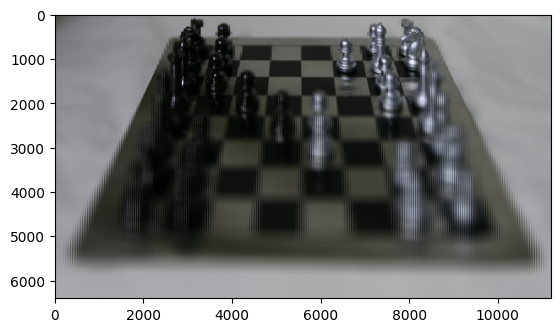

In [2]:
img = skimage.io.imread('data/chessboard_lightfield.png')
print(img.shape)
plt.imshow(img)
print(img.min(), img.max())

In [10]:
def normalize(img):
    return (img - img.min())/(img.max() - img.min())

In [11]:
img_norm = normalize(img)
print(img_norm.min(), img_norm.max())

0.0 1.0


In [15]:
# naive WAY OF CREATING LIGHTFIELD
h, w, c = img.shape
lightfield = []
print(h, w)

for i, s in enumerate(range(0, h, 16)[:-1]):
    for j, t in enumerate(range(0, w, 16)[:-1]):
        for u in range(16):
            for v in range(16):
                pix_color = np.expand_dims(img[s + u, t + v, :], axis=0)
                lightfield.append([u, v, s, t, pix_color])
lightfield = np.array(lightfield)
lightfield.shape

6400 11200


/var/folders/hd/n1h1bh010cv5cm5k41bsp7y00000gp/T/ipykernel_2216/1818272992.py:12: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  lightfield = np.array(lightfield)


(71398656, 5)

In [16]:
lightfield[:5]

array([[0, 0, 0, 0, array([[66, 69, 65]], dtype=uint8)],
       [0, 1, 0, 0, array([[66, 68, 63]], dtype=uint8)],
       [0, 2, 0, 0, array([[65, 68, 60]], dtype=uint8)],
       [0, 3, 0, 0, array([[64, 68, 62]], dtype=uint8)],
       [0, 4, 0, 0, array([[65, 65, 63]], dtype=uint8)]], dtype=object)

#### ACTUAL CODE STARTS HERE

In [13]:
h, w, c = img.shape
# lightfield another way of loading 
LF = np.zeros((16, 16, int(h/16), int(w/16), 3))

for i, s in enumerate(range(0, h, 16)[:-1]):
    for j, t in enumerate(range(0, w, 16)[:-1]):
        lenslet = img_norm[s:s+16, t:t+16, :]
        LF[:, :, i, j, :] = lenslet
LF.shape

(16, 16, 400, 700, 3)

In [14]:
# sub apertures
pinhole_view = []
for i in range(16):
    for j in range(16):
        pinhole_view.append(LF[i, j, :, :, :])
len(pinhole_view)

256

(256, 400, 700, 3)


/var/folders/hd/n1h1bh010cv5cm5k41bsp7y00000gp/T/ipykernel_2216/2282670482.py:9: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


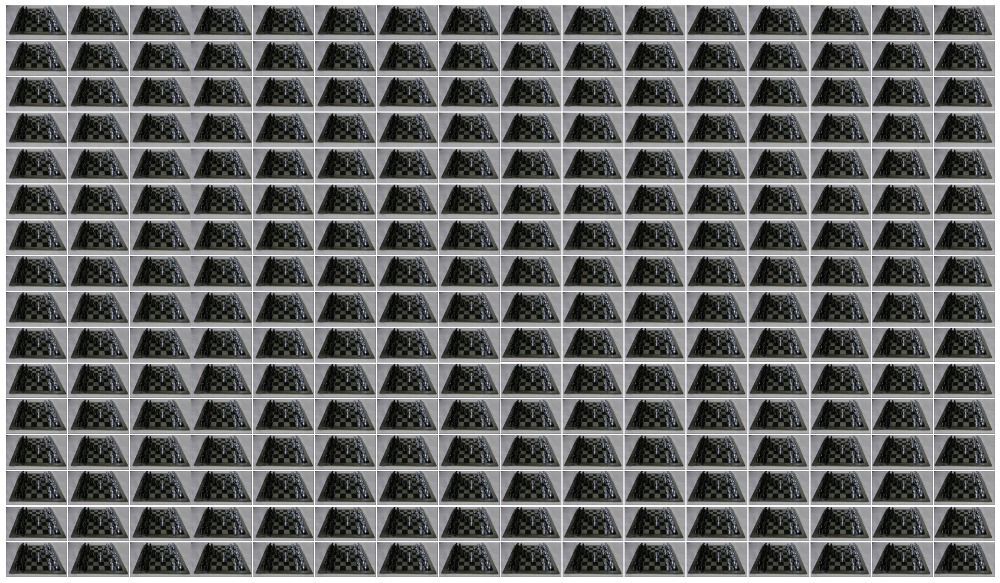

In [47]:
vis = np.stack(pinhole_view, axis=0)
print(vis.shape)

fig = plt.figure(figsize=(18, 10))
grid = ImageGrid(fig, 111, nrows_ncols=(16, 16), share_all=True)
for i, (ax, im) in enumerate(zip(grid, vis)):
    ax.imshow(im)  
    ax.axis("off")
plt.tight_layout()
plt.savefig('q12.png')
plt.show()

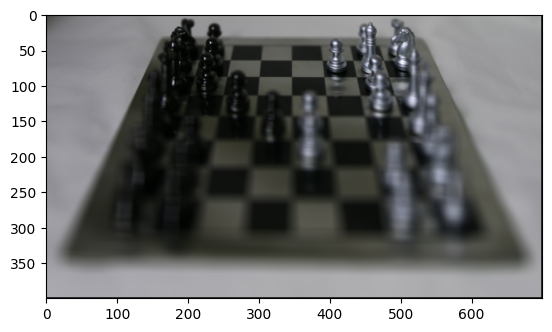

In [53]:
temp = vis.mean(axis=0)
temp.shape
plt.imshow(temp, cmap="gray")
plt.show()

In [15]:
# Refocusing 
# coordinate centering - express coordinates u and v relative to center of each lenslet 
lenslet_size = 16
maxUV = (lenslet_size - 1)/2 # 0-centered 
u_scaled = np.arange(lenslet_size) - maxUV
v_scaled = np.arange(lenslet_size) - maxUV
print(u_scaled, v_scaled)

[-7.5 -6.5 -5.5 -4.5 -3.5 -2.5 -1.5 -0.5  0.5  1.5  2.5  3.5  4.5  5.5
  6.5  7.5] [-7.5 -6.5 -5.5 -4.5 -3.5 -2.5 -1.5 -0.5  0.5  1.5  2.5  3.5  4.5  5.5
  6.5  7.5]


In [26]:
def refocus(LF, d=0.0):
    # extract shifted sub-apertures 
    shifted_pinhole_view = []

    for i in range(16):
        for j in range(16):
            default_view = LF[i, j, :, :, :]
            # print(default_view[:, :, 0].shape)
            centeredu = u_scaled[i]
            centeredv = -v_scaled[j]
            shift_s = d * centeredu
            shift_t = d * centeredv

            x = np.arange(0, 400)
            y = np.arange(0, 700)
            # interpolate default sub-aperture at shifted coordinates 
            interp_c0 = scipy.interpolate.interp2d(y, x, default_view[:, :, 0], fill_value=0)
            interp_c1 = scipy.interpolate.interp2d(y, x, default_view[:, :, 1], fill_value=0)
            interp_c2 = scipy.interpolate.interp2d(y, x, default_view[:, :, 2], fill_value=0)

            # sample shifted image 
            x_get = x + shift_s
            y_get = y + shift_t

            c0_final = interp_c0(y_get, x_get)
            c1_final = interp_c1(y_get, x_get)
            c2_final = interp_c2(y_get, x_get)
            # x_mesh, y_mesh = np.meshgrid(x_get, y_get, indexing='ij')
            # c0_final = interp_c0(x_mesh, y_mesh)
            # c1_final = interp_c1(x_mesh, y_mesh)
            # c2_final = interp_c2(x_mesh, y_mesh)
            result = np.stack((c0_final, c1_final, c2_final), axis=-1)
            shifted_pinhole_view.append(result)
    new_focus_lens_sim = np.stack(shifted_pinhole_view, axis=0)
    print(new_focus_lens_sim.shape)
    
    # shifting done, create the final summed image
    new_img = new_focus_lens_sim.mean(axis=0)
    return new_img

(256, 400, 700, 3)


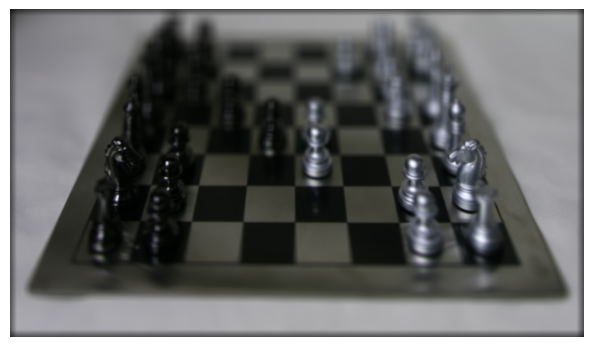

In [35]:
new_img_d1 = refocus(LF, d=1.0)
plt.imshow(new_img_d1, cmap="gray")
plt.tight_layout()
plt.axis('off')
plt.savefig("data/results/refocus_d1.png")
plt.show()

(256, 400, 700, 3)


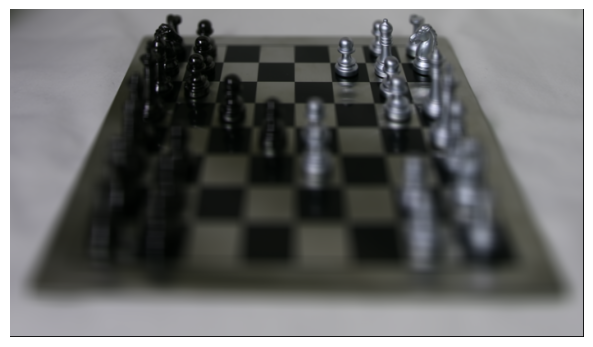

In [36]:
new_img_d0 = refocus(LF, d=0.0)
plt.imshow(new_img_d0, cmap="gray")
plt.tight_layout()
plt.axis('off')
plt.savefig("data/results/refocus_d0.png")
plt.show()

(256, 400, 700, 3)


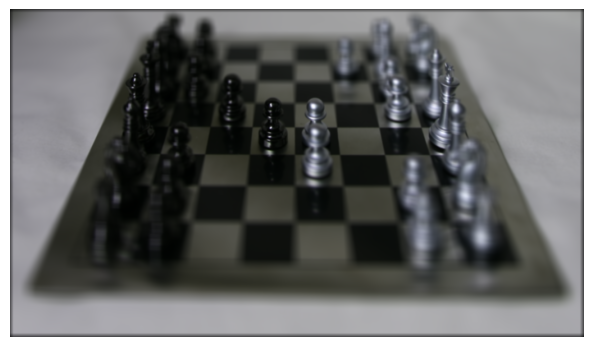

In [37]:
new_img_d1e_5 = refocus(LF, d=0.5)
plt.imshow(new_img_d1e_5, cmap="gray")
plt.tight_layout()
plt.axis('off')
plt.savefig("data/results/refocus_d1e-5.png")
plt.show()

(256, 400, 700, 3)


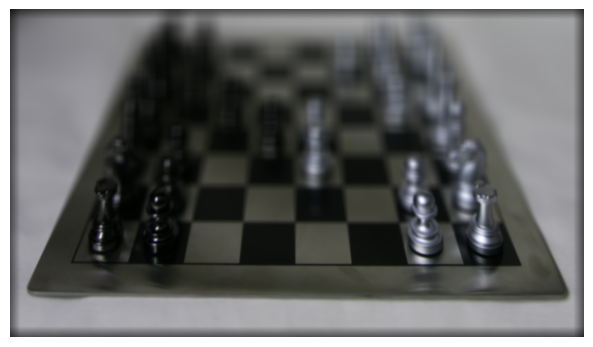

In [38]:
new_img_d15e_1 = refocus(LF, d=1.5)
plt.imshow(new_img_d15e_1, cmap="gray")
plt.tight_layout()
plt.axis('off')
plt.savefig("data/results/refocus_d15e-1.png")
plt.show()

(256, 400, 700, 3)


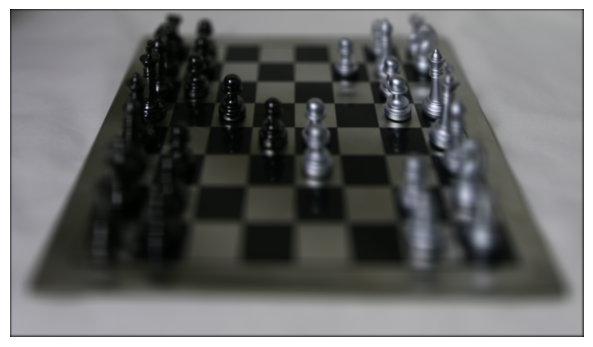

In [39]:
new_img_d1e_3 = refocus(LF, d=0.3)
plt.imshow(new_img_d1e_3, cmap="gray")
plt.tight_layout()
plt.axis('off')
plt.savefig("data/results/refocus_d1e-3.png")
plt.show()

In [64]:
def gamma(C):
    h, w = C.shape
    
    gC = np.zeros((h, w))
    for i in range(h):
        for j in range(w):
            if C[i, j] <= 0.0031308:
                gC[i, j] = 12.92 * C[i, j]
            else:
                temp = 1.055 * pow(C[i, j], 0.4167)
                gC[i, j] =  temp - 0.055
    return gC

In [94]:
def all_in_focus(img, sigma1=6, sigma2=8):
    M_RGB_XYZ = np.array([[0.4124564, 0.3575761, 0.1804375],
     [0.2126729, 0.7151522, 0.0721750],
     [0.0193339, 0.1191920, 0.9503041]])
    xyz = np.matmul(img, M_RGB_XYZ)
    lumi = xyz[:, :, 1]
    lumi = gamma(lumi)
    # plt.imshow(lumi, cmap="gray")
    
    I_lowfreq = scipy.ndimage.gaussian_filter(lumi, sigma1)
    # plt.imshow(I_lowfreq, cmap="gray")
    
    I_highfreq = lumi - I_lowfreq
    # plt.imshow(I_highfreq, cmap="gray")
    
    w_sharp = scipy.ndimage.gaussian_filter(np.square(I_highfreq), sigma2)
    
    return w_sharp

In [95]:
weights = all_in_focus(new_img_d1e_3)

In [96]:
weights.shape # use same weights across channels 

(400, 700)

In [109]:
def depth_from_focus(LF, sigma1=6, sigma2=8):
    focal_stack = []
    sharpness_weights = []
    depths = [0.0, 0.3, 0.6, 0.9, 1.2, 1.5]
    I_all_in_focus_num = []
    I_Depth_num = []
    for d in depths:
        new_img_d = refocus(LF, d)
        focal_stack.append(new_img_d)

        # get sharpness weights 
        weights_d = all_in_focus(new_img_d, sigma1, sigma2)
        sharpness_weights.append(weights_d)
        if d==0.3:
            plot_2fig(new_img_d, weights_d, name='data/results/wsharpness_d1e-3_{}{}.png'.format(sigma1, sigma2), title1="Refocused image", title2='sharpness weights')
        else:
            plot_2fig(new_img_d, weights_d, name=None, title1="Refocused image", title2='sharpness weights')

        # get numerators for all-in-focus image and depth
        I_all_in_focus_num.append(new_img_d * np.expand_dims(weights_d, -1))
        I_Depth_num.append(weights_d*d)

    print(len(sharpness_weights), len(I_Depth_num))
    sigma_d_sharpness = sum(sharpness_weights)

    I_all_in_focus = sum(I_all_in_focus_num) / np.expand_dims(sigma_d_sharpness, axis=-1)
    Depth_image = sum(I_Depth_num) / sigma_d_sharpness
    return I_all_in_focus, Depth_image

(256, 400, 700, 3)


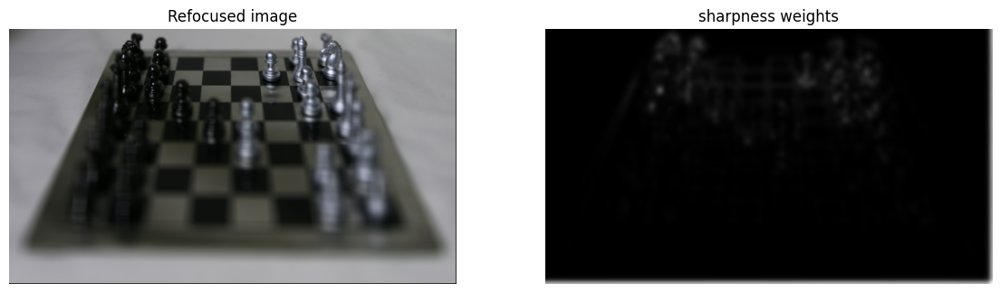

(256, 400, 700, 3)


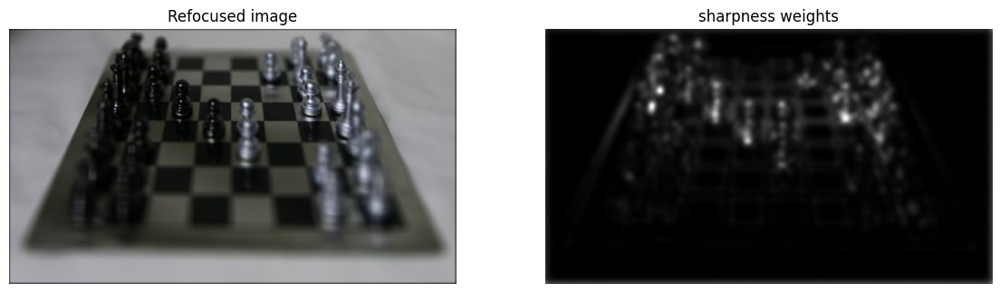

(256, 400, 700, 3)


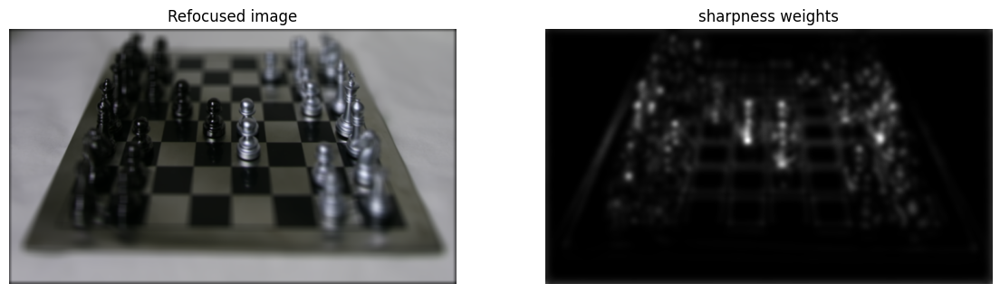

(256, 400, 700, 3)


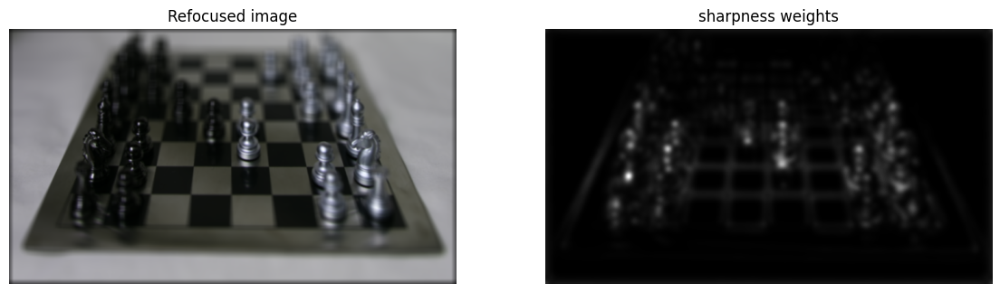

(256, 400, 700, 3)


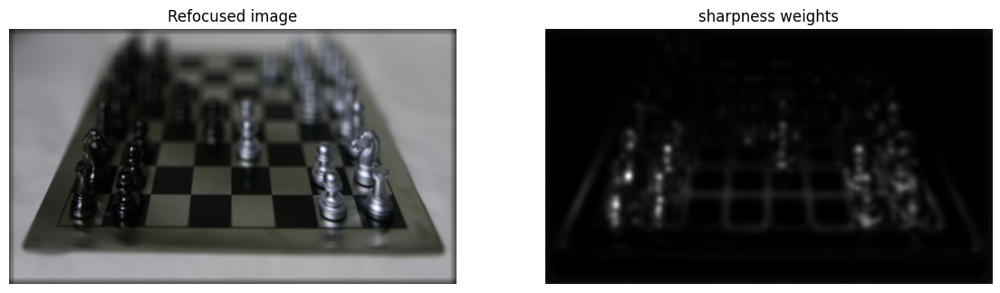

(256, 400, 700, 3)


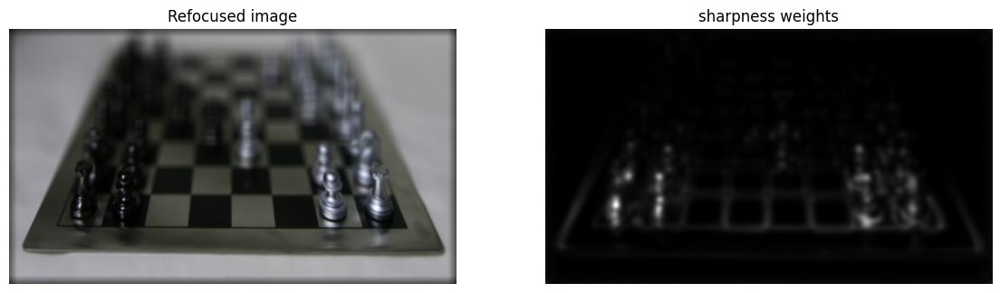

6 6


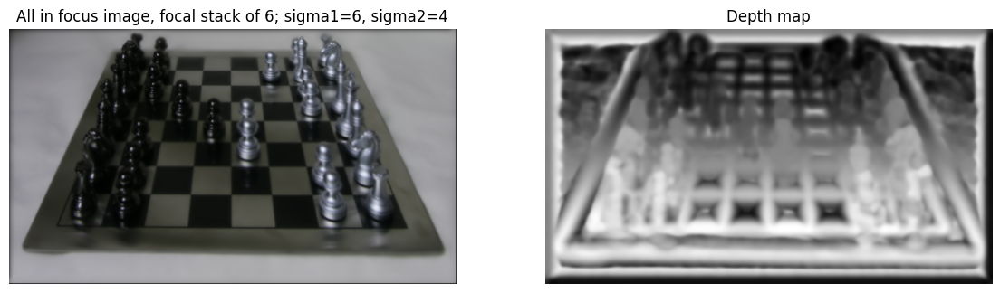

In [110]:
I_all_in_focus, Depth_image = depth_from_focus(LF, sigma1=6, sigma2=4)
plot_2fig(I_all_in_focus, Depth_image, name="data/results/allfocus_6_4.png", title1="All in focus image, focal stack of 6; sigma1=6, sigma2=4", title2='Depth map')

(256, 400, 700, 3)


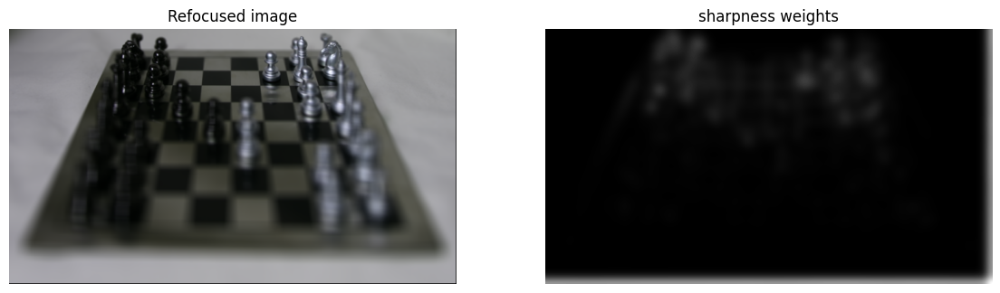

(256, 400, 700, 3)


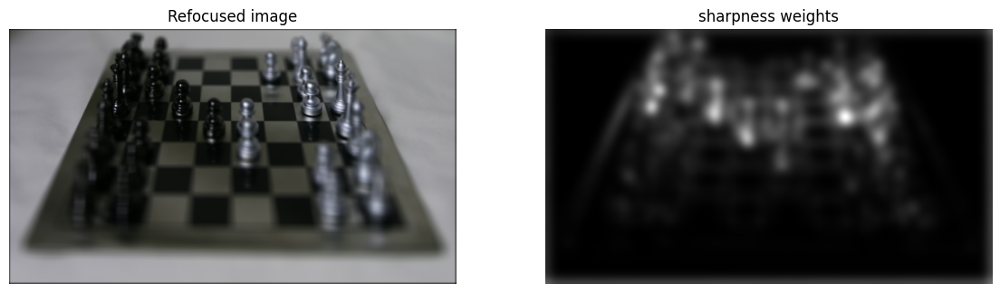

(256, 400, 700, 3)


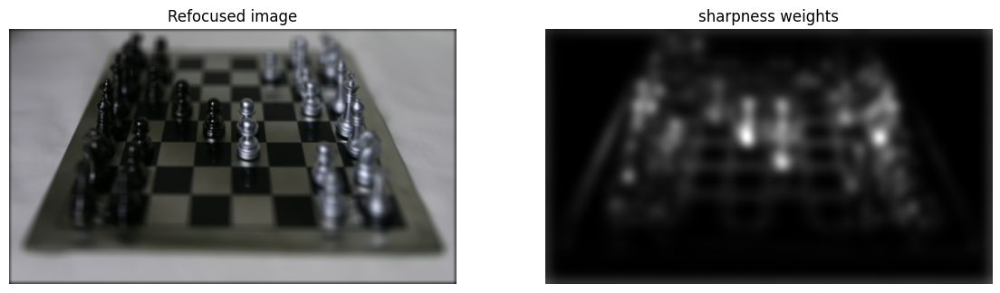

(256, 400, 700, 3)


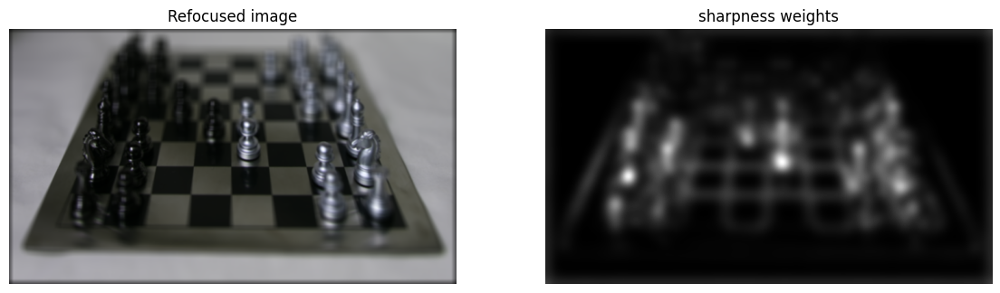

(256, 400, 700, 3)


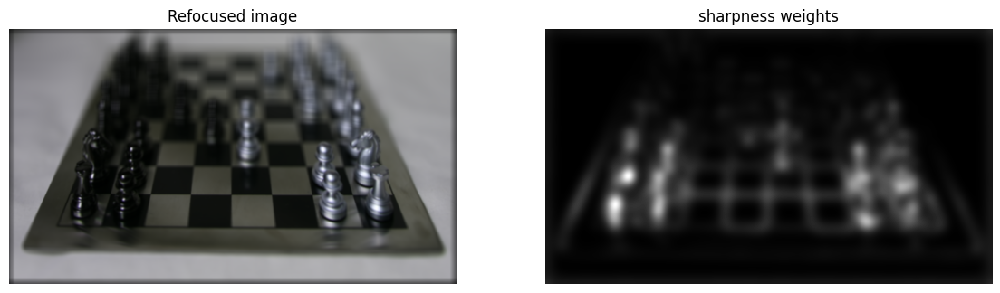

(256, 400, 700, 3)


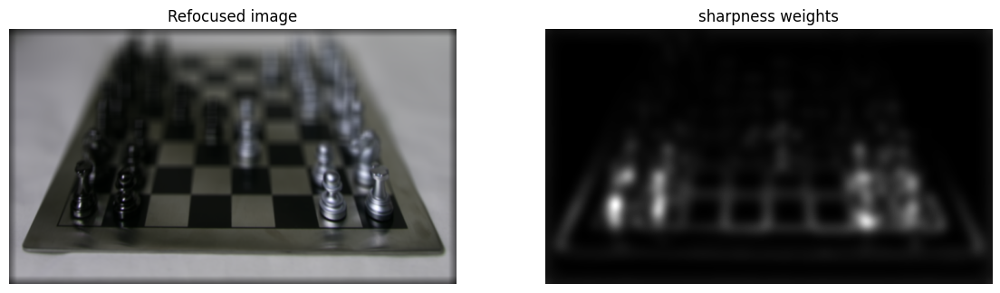

6 6


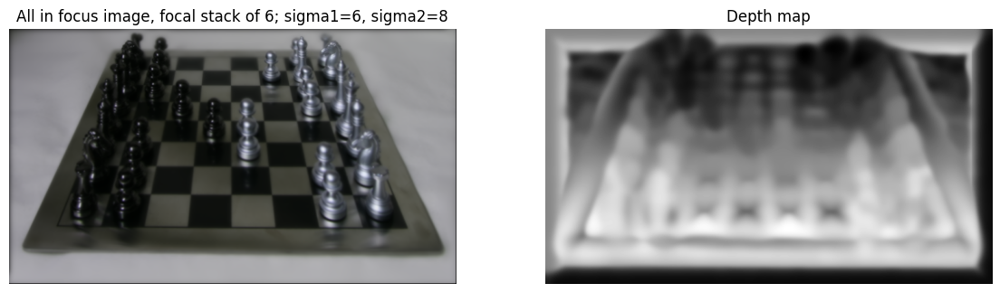

In [112]:
I_all_in_focus, Depth_image = depth_from_focus(LF)
plot_2fig(I_all_in_focus, Depth_image, name="data/results/allfocus_6_8.png", title1="All in focus image, focal stack of 6; sigma1=6, sigma2=8", title2='Depth map')

(256, 400, 700, 3)


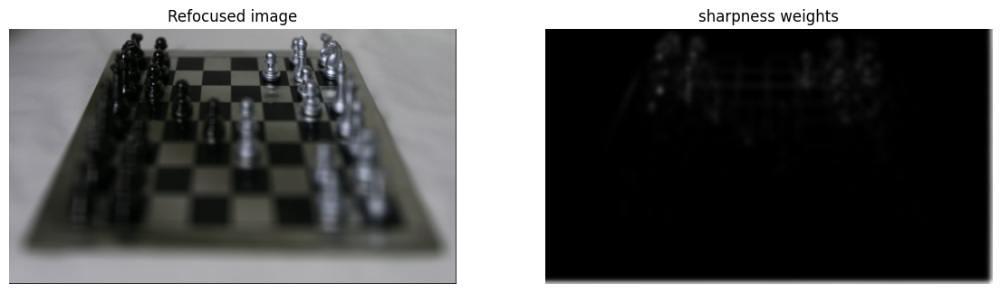

(256, 400, 700, 3)


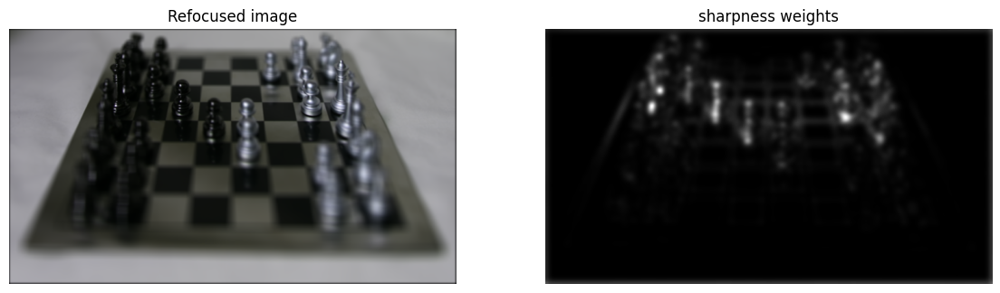

(256, 400, 700, 3)


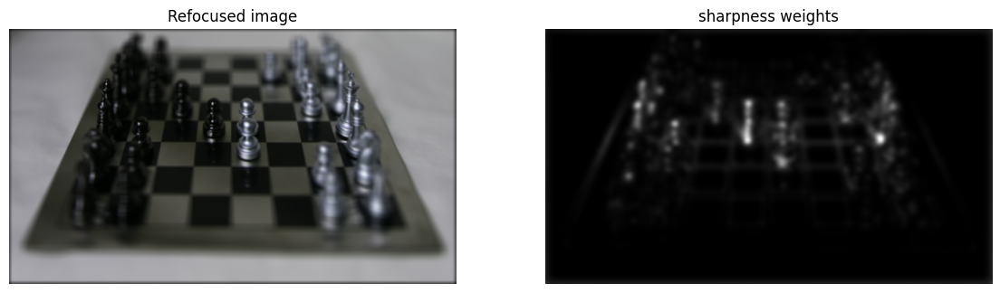

(256, 400, 700, 3)


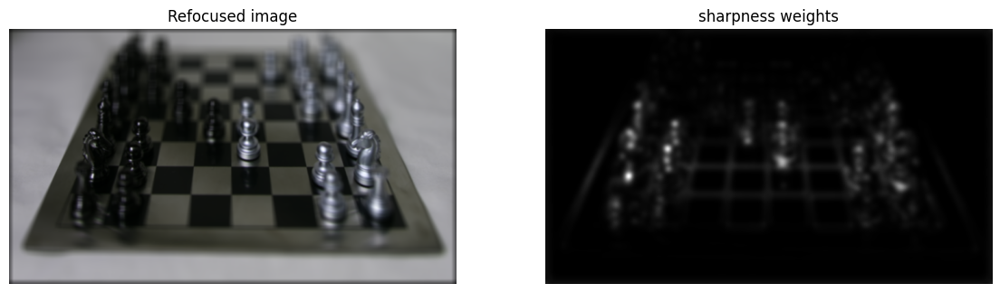

(256, 400, 700, 3)


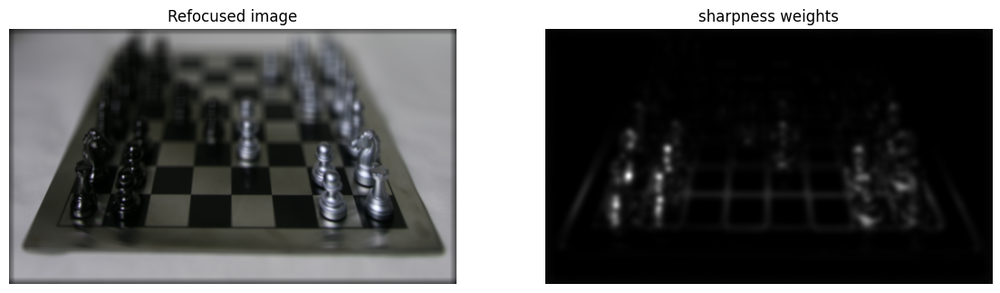

(256, 400, 700, 3)


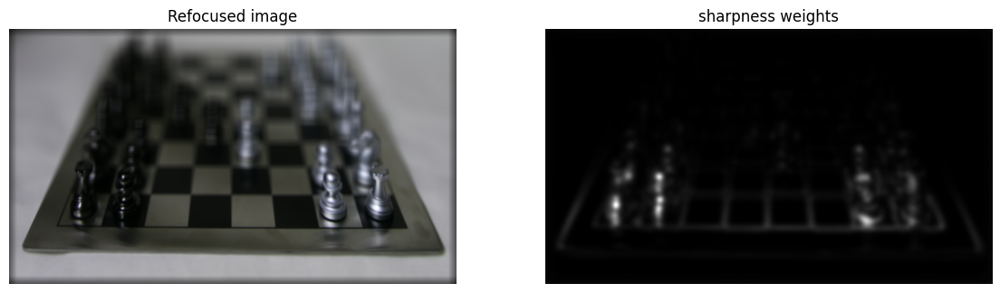

6 6


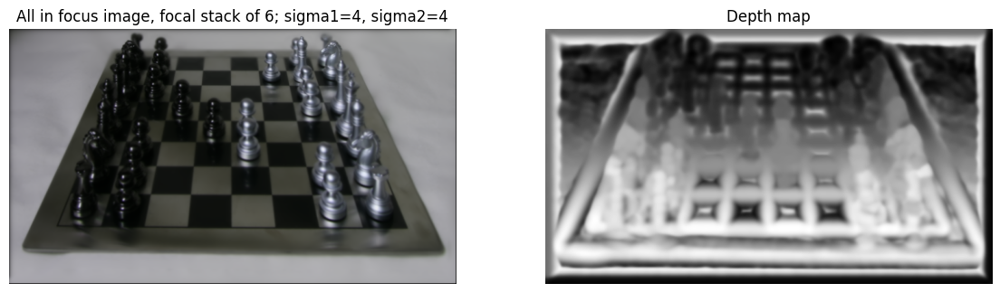

In [111]:
I_all_in_focus, Depth_image = depth_from_focus(LF, sigma1=4, sigma2=4)
plot_2fig(I_all_in_focus, Depth_image, name="data/results/allfocus_4_4.png", title1="All in focus image, focal stack of 6; sigma1=4, sigma2=4", title2='Depth map')


(256, 400, 700, 3)


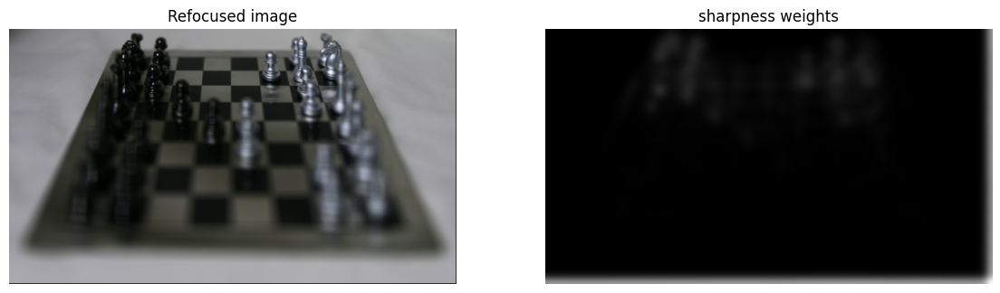

(256, 400, 700, 3)


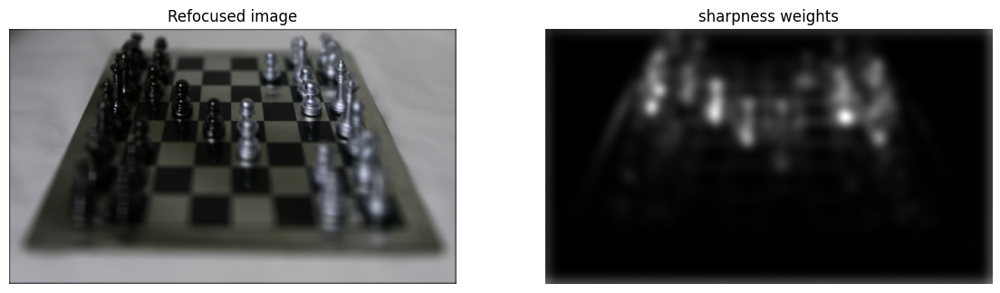

(256, 400, 700, 3)


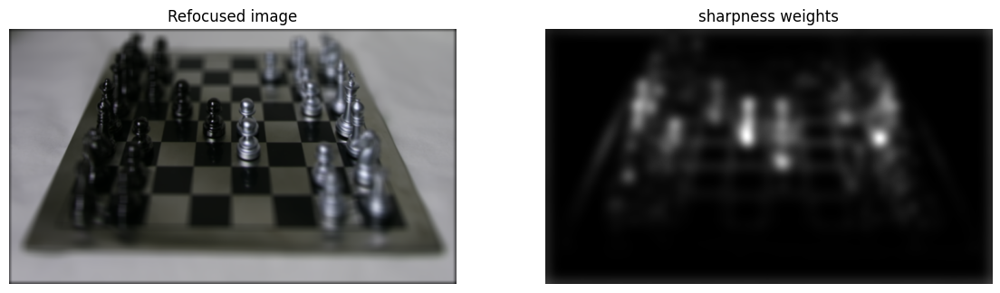

(256, 400, 700, 3)


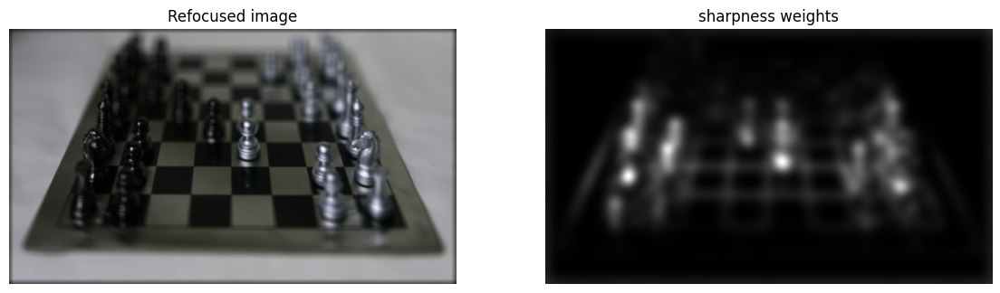

(256, 400, 700, 3)


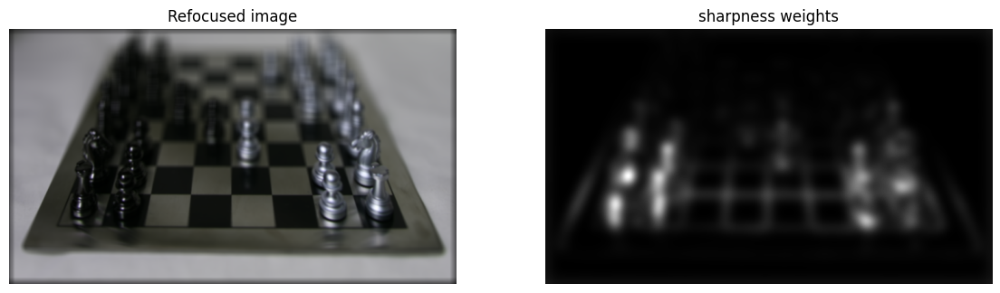

(256, 400, 700, 3)


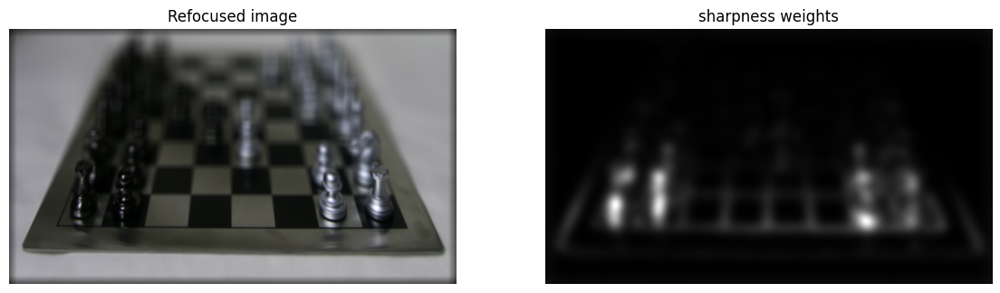

6 6


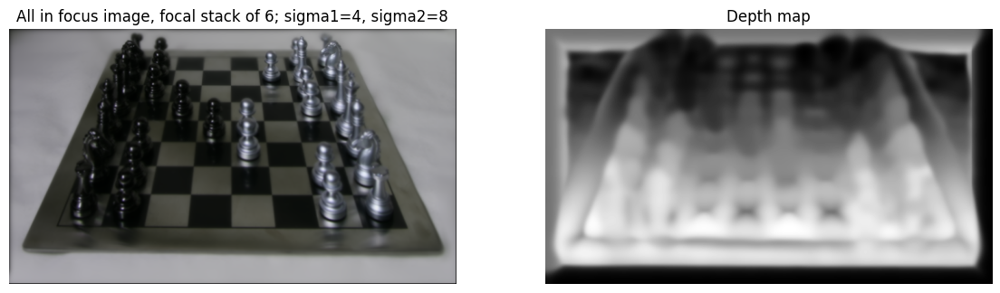

In [113]:
I_all_in_focus, Depth_image = depth_from_focus(LF, sigma1=4, sigma2=8)
plot_2fig(I_all_in_focus, Depth_image, name="data/results/allfocus_4_8.png", title1="All in focus image, focal stack of 6; sigma1=4, sigma2=8", title2='Depth map')


(256, 400, 700, 3)


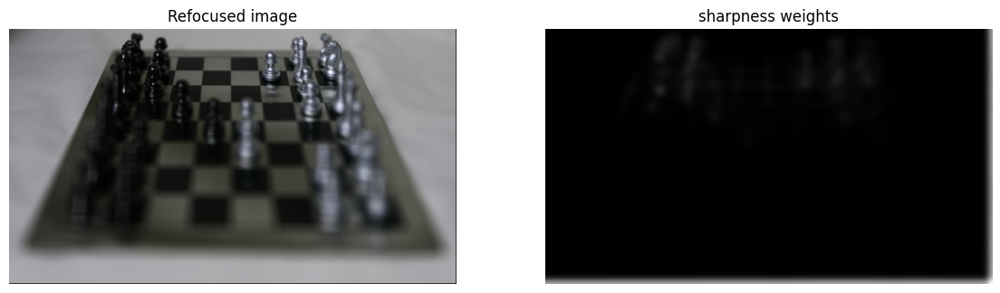

(256, 400, 700, 3)


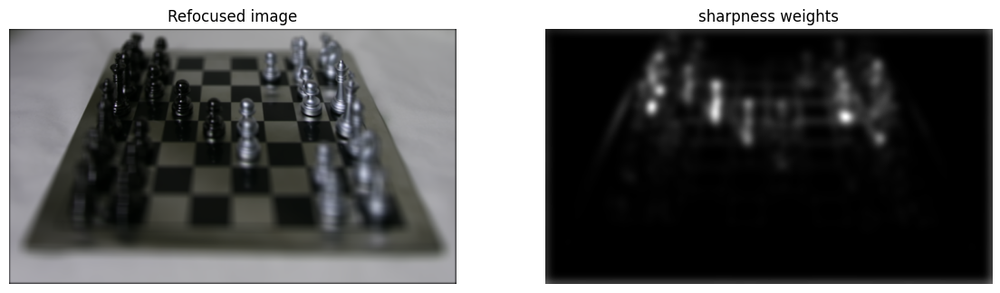

(256, 400, 700, 3)


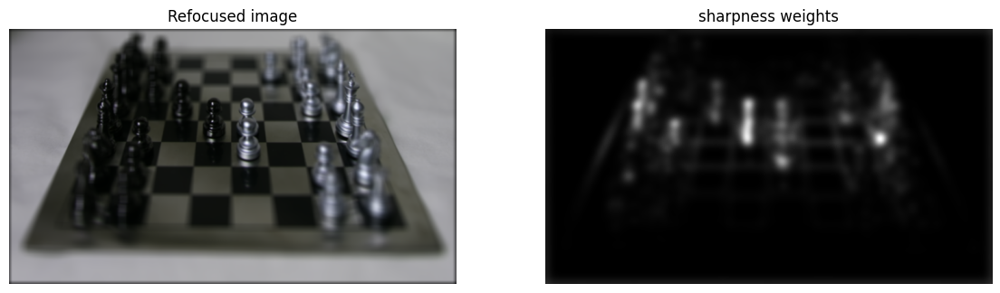

(256, 400, 700, 3)


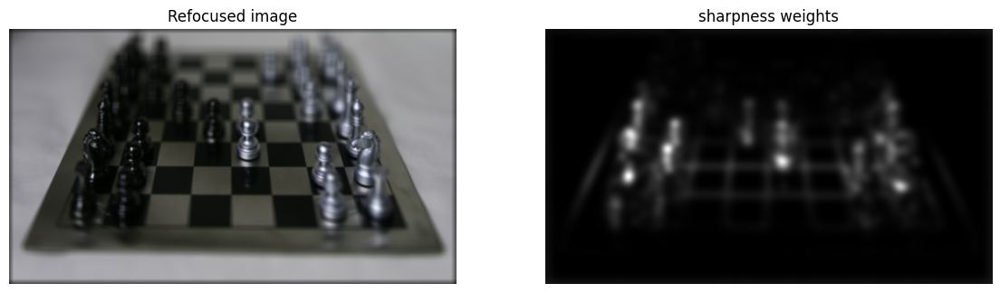

(256, 400, 700, 3)


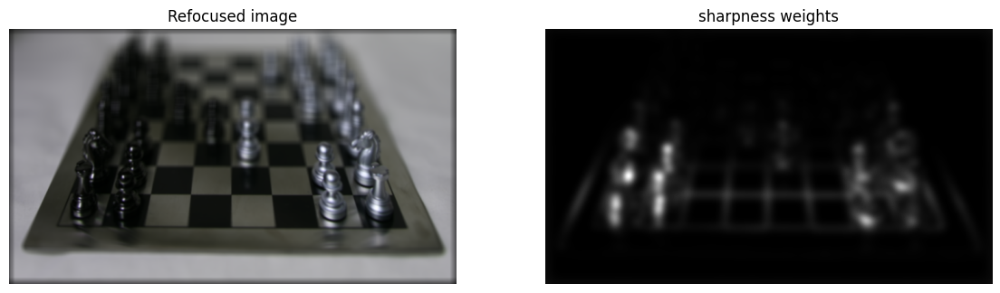

(256, 400, 700, 3)


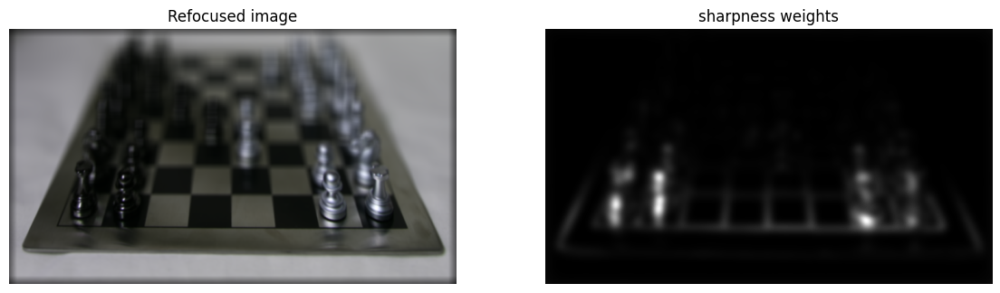

6 6


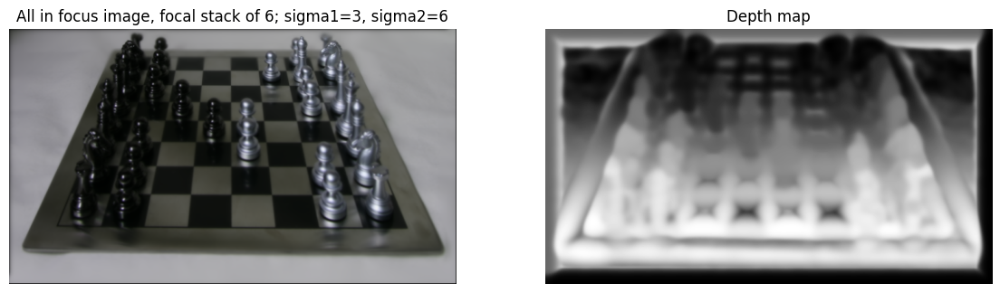

In [114]:
I_all_in_focus, Depth_image = depth_from_focus(LF, sigma1=3, sigma2=6)
plot_2fig(I_all_in_focus, Depth_image, name="data/results/allfocus_3_6.png", title1="All in focus image, focal stack of 6; sigma1=3, sigma2=6", title2='Depth map')


In [ ]:
I_all_in_focus, Depth_image = depth_from_focus(LF, sigma1=4, sigma2=6)
plot_2fig(I_all_in_focus, Depth_image, name="data/results/allfocus_3_6.png", title1="All in focus image, focal stack of 6; sigma1=3, sigma2=6", title2='Depth map')


### Assumption - the pin hole aperture view coordinates on the main lens are not centered. The pinhple views start from u=0, v=0
 - check later if wrong

In [161]:
def focal_aperture_refocus(LF, d=0.0):
    allA_refocused = []
    max_A = 16
    print(f'mid coordinate of the main lens aperture {max_A //2, max_A //2}')
    
    
    for side in [8, 6, 4, 2, 1]:
        print(side)
        # coordinate centering - express coordinates u and v relative to center of each lenslet 
        lenslet_size = 2*side
        maxUV = (lenslet_size - 1)/2 # 0-centered 
        u_scaled = np.arange(lenslet_size) - maxUV
        v_scaled = np.arange(lenslet_size) - maxUV
        print(u_scaled, v_scaled)
        # extract shifted sub-apertures 
        shifted_pinhole_view = []
        for i in range(-side, side):
            for j in range(-side, side):
                ind_u = i + max_A //2 
                ind_v = j + max_A //2 
                # IND_U, IND_V are for extracting pinhole views from center
                # print(i, j, ind_u, ind_v)
                if ind_u < max_A and ind_v < max_A:
                    default_view = LF[ind_u, ind_v, :, :, :]
                    # print(default_view[:, :, 0].shape)
                    centeredu = u_scaled[i+side]
                    centeredv = -v_scaled[j+side]
                    shift_s = d * centeredu
                    shift_t = d * centeredv

                    x = np.arange(0, 400)
                    y = np.arange(0, 700)
                    # interpolate default sub-aperture at shifted coordinates 
                    interp_c0 = scipy.interpolate.interp2d(y, x, default_view[:, :, 0], fill_value=0)
                    interp_c1 = scipy.interpolate.interp2d(y, x, default_view[:, :, 1], fill_value=0)
                    interp_c2 = scipy.interpolate.interp2d(y, x, default_view[:, :, 2], fill_value=0)

                    # sample shifted image 
                    x_get = x + shift_s
                    y_get = y + shift_t

                    c0_final = interp_c0(y_get, x_get)
                    c1_final = interp_c1(y_get, x_get)
                    c2_final = interp_c2(y_get, x_get)
                    # x_mesh, y_mesh = np.meshgrid(x_get, y_get, indexing='ij')
                    # c0_final = interp_c0(x_mesh, y_mesh)
                    # c1_final = interp_c1(x_mesh, y_mesh)
                    # c2_final = interp_c2(x_mesh, y_mesh)
                    result = np.stack((c0_final, c1_final, c2_final), axis=-1)
                    shifted_pinhole_view.append(result)
        new_focus_lens_sim = np.stack(shifted_pinhole_view, axis=0)
        print(new_focus_lens_sim.shape)
    
        # shifting done, create the final summed image
        new_img = new_focus_lens_sim.mean(axis=0)
        allA_refocused.append(new_img)
    print(f'number of aperture images at depth {d}, {len(allA_refocused)}')
    return allA_refocused

In [162]:
new_img_A = focal_aperture_refocus(LF, d=0.5)

mid coordinate of the main lens aperture (8, 8)
8
[-7.5 -6.5 -5.5 -4.5 -3.5 -2.5 -1.5 -0.5  0.5  1.5  2.5  3.5  4.5  5.5
  6.5  7.5] [-7.5 -6.5 -5.5 -4.5 -3.5 -2.5 -1.5 -0.5  0.5  1.5  2.5  3.5  4.5  5.5
  6.5  7.5]
(256, 400, 700, 3)
6
[-5.5 -4.5 -3.5 -2.5 -1.5 -0.5  0.5  1.5  2.5  3.5  4.5  5.5] [-5.5 -4.5 -3.5 -2.5 -1.5 -0.5  0.5  1.5  2.5  3.5  4.5  5.5]
(144, 400, 700, 3)
4
[-3.5 -2.5 -1.5 -0.5  0.5  1.5  2.5  3.5] [-3.5 -2.5 -1.5 -0.5  0.5  1.5  2.5  3.5]
(64, 400, 700, 3)
2
[-1.5 -0.5  0.5  1.5] [-1.5 -0.5  0.5  1.5]
(16, 400, 700, 3)
1
[-0.5  0.5] [-0.5  0.5]
(4, 400, 700, 3)
number of aperture images at depth 0.5, 5


mid coordinate of the main lens aperture (8, 8)
8
[-7.5 -6.5 -5.5 -4.5 -3.5 -2.5 -1.5 -0.5  0.5  1.5  2.5  3.5  4.5  5.5
  6.5  7.5] [-7.5 -6.5 -5.5 -4.5 -3.5 -2.5 -1.5 -0.5  0.5  1.5  2.5  3.5  4.5  5.5
  6.5  7.5]
(256, 400, 700, 3)
6
[-5.5 -4.5 -3.5 -2.5 -1.5 -0.5  0.5  1.5  2.5  3.5  4.5  5.5] [-5.5 -4.5 -3.5 -2.5 -1.5 -0.5  0.5  1.5  2.5  3.5  4.5  5.5]
(144, 400, 700, 3)
4
[-3.5 -2.5 -1.5 -0.5  0.5  1.5  2.5  3.5] [-3.5 -2.5 -1.5 -0.5  0.5  1.5  2.5  3.5]
(64, 400, 700, 3)
2
[-1.5 -0.5  0.5  1.5] [-1.5 -0.5  0.5  1.5]
(16, 400, 700, 3)
1
[-0.5  0.5] [-0.5  0.5]
(4, 400, 700, 3)
number of aperture images at depth 0.0, 5
5
mid coordinate of the main lens aperture (8, 8)
8
[-7.5 -6.5 -5.5 -4.5 -3.5 -2.5 -1.5 -0.5  0.5  1.5  2.5  3.5  4.5  5.5
  6.5  7.5] [-7.5 -6.5 -5.5 -4.5 -3.5 -2.5 -1.5 -0.5  0.5  1.5  2.5  3.5  4.5  5.5
  6.5  7.5]
(256, 400, 700, 3)
6
[-5.5 -4.5 -3.5 -2.5 -1.5 -0.5  0.5  1.5  2.5  3.5  4.5  5.5] [-5.5 -4.5 -3.5 -2.5 -1.5 -0.5  0.5  1.5  2.5  3.5  4.5  5.5]
(144

TypeError: Invalid shape (5, 400, 700, 3) for image data

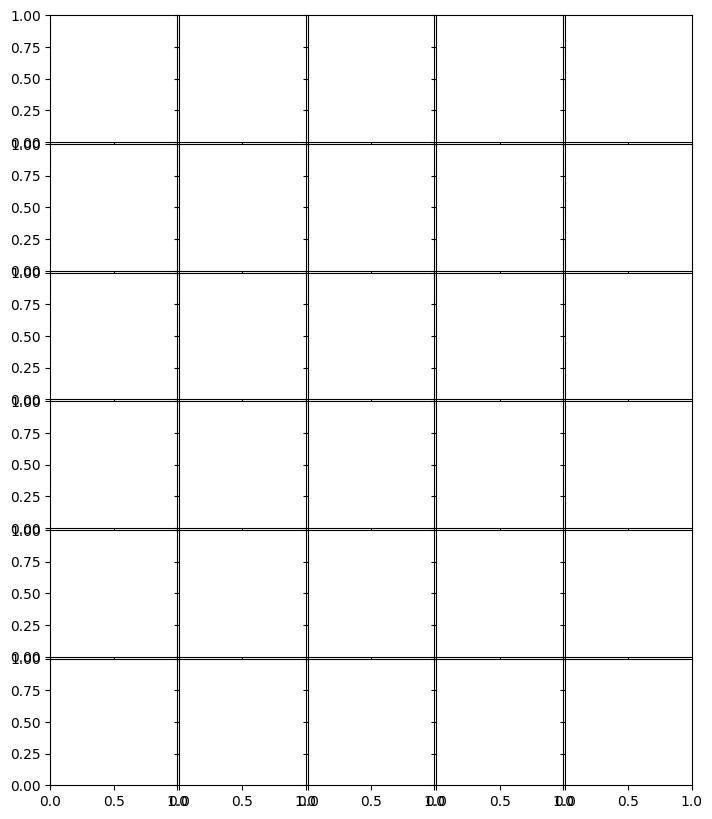

In [172]:
# create focus-aperture collage 
depths = [0.0, 0.3, 0.6, 0.9, 1.2, 1.5]
focus_aperture_stack = []
vis_stack = []
for d in depths:
    aperture_stack = focal_aperture_refocus(LF, d)
    print(len(aperture_stack))
    focus_aperture_stack.append(aperture_stack)
    vis_stack.append(np.stack(aperture_stack, axis=0))

(30, 400, 700, 3)


/var/folders/hd/n1h1bh010cv5cm5k41bsp7y00000gp/T/ipykernel_17001/2749489240.py:23: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


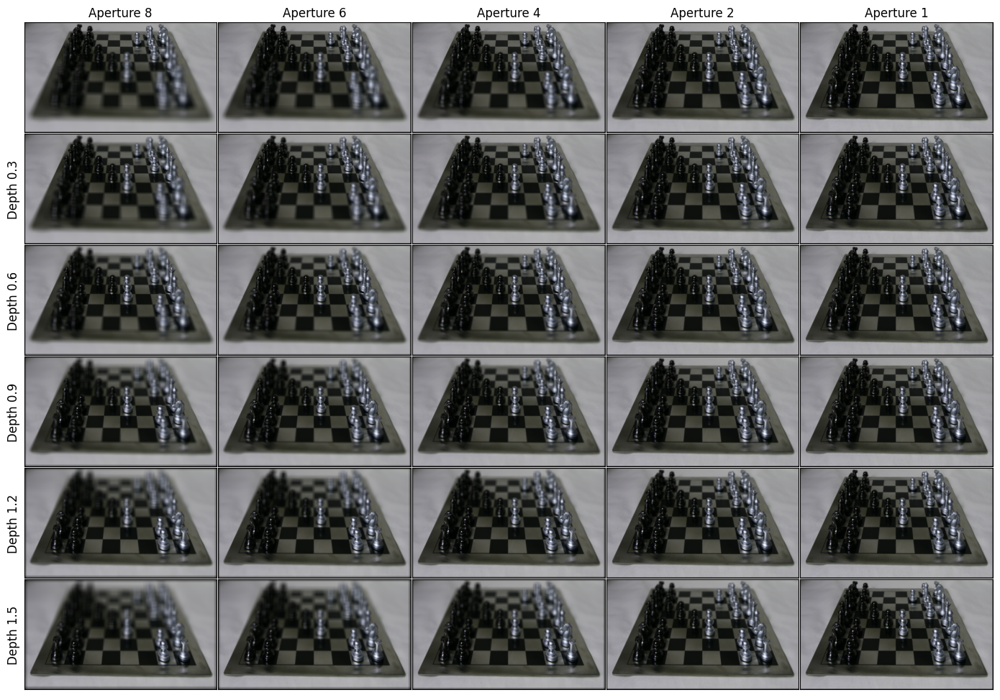

In [198]:
vis = []
for d in range(6):
    for a in range(5):
        vis.append(focus_aperture_stack[d][a])
vis = np.stack(vis, axis=0)
print(vis.shape)

col = ['Aperture 8', 'Aperture 6', 'Aperture 4', 'Aperture 2', 'Aperture 1']
row = ['Depth 0.0', 'Depth 0.3', 'Depth 0.6', 'Depth 0.9', 'Depth 1.2', 'Depth 1.5']

fig = plt.figure(figsize=(14, 10))
grid = ImageGrid(fig, 111, nrows_ncols=(6, 5), share_all=True)
for i, (ax, im) in enumerate(zip(grid, vis)):
    ax.imshow(im)  
    
    if i < 5:
        ax.set_title(col[i])
    elif i % 5 == 0:
        ax.set_ylabel(row[i//5], rotation=90, size='large')
    ax.set_xticks([])
    ax.set_yticks([])

fig.tight_layout()
plt.savefig('q1_last.png')
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


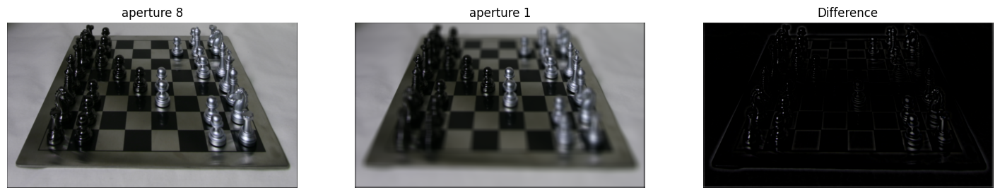

In [197]:
plot_2fig_difference(new_img_A[4], new_img_A[0], name='difference.png', title1='aperture 8', title2='aperture 1')

(5, 400, 700, 3)


/var/folders/hd/n1h1bh010cv5cm5k41bsp7y00000gp/T/ipykernel_17001/2933591960.py:9: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


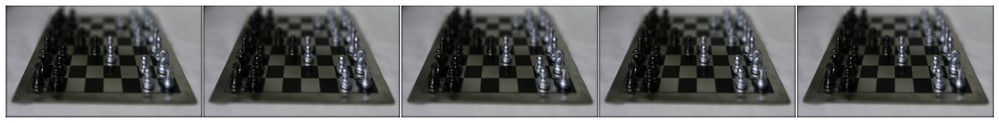

In [145]:
fig = plt.figure(figsize=(18, 10))
grid = ImageGrid(fig, 111, nrows_ncols=(1, 5), share_all=True)
for i, (ax, im) in enumerate(zip(grid, vis)):
    ax.imshow(im)  
    ax.axis("off")
plt.tight_layout()
plt.savefig('q1_last.png')
plt.show()

In [203]:
vis_stack[0].shape, len(vis_stack) # A inside, list of Ds. 

((5, 400, 700, 3), 6)

(5, 6, 400, 700, 3)


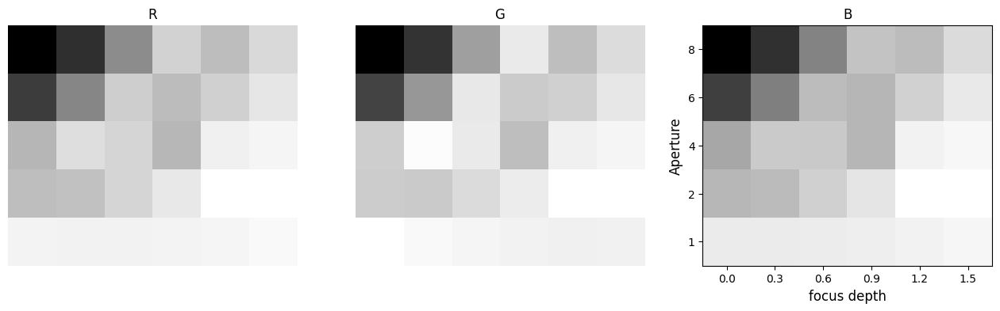

In [250]:
# plot AFI for pixel (x, y)
x = 255
y = 500

temp = np.stack(vis_stack, axis=1)
print(temp.shape)

AFI = temp[:, :, x, y, :]

fig = plt.figure(figsize=(16, 4))

fig.add_subplot(1, 3, 1)
plt.imshow(AFI[:, :, 0], cmap='gray')
plt.title('R')
plt.axis('off')
fig.add_subplot(1, 3, 2)
plt.imshow(AFI[:, :, 1], cmap='gray')
plt.title('G')
plt.axis('off')
fig.add_subplot(1, 3, 3)
plt.imshow(AFI[:, :, 2], cmap='gray')
plt.title('B')

plt.xlabel('focus depth', fontsize=12)
plt.ylabel('Aperture', fontsize=12)

plt.yticks(ticks = np.arange(5), labels=[8, 6, 4, 2, 1])
plt.xticks(ticks = np.arange(6), labels=[0.0, 0.3, 0.6, 0.9, 1.2, 1.5])

plt.savefig('AFI_pix2_255_500.png', bbox_inches='tight')
plt.show()

In [287]:
depths = [0.0, 0.3, 0.6, 0.9, 1.2, 1.5]
# get pixel depth map
print(temp.shape)
aperture_variance = np.var(temp, axis=0)
print(aperture_variance.shape)

depth_indices = np.argmin(aperture_variance, axis=0)
h, w, _ = depth_indices.shape
depth_map = np.zeros((h, w, 3))

for i in range(h):
    for j in range(w):
        for c in range(3):
            depth_map[i, j, c] = depths[depth_indices[i, j, c]]

(5, 6, 400, 700, 3)
(6, 400, 700, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


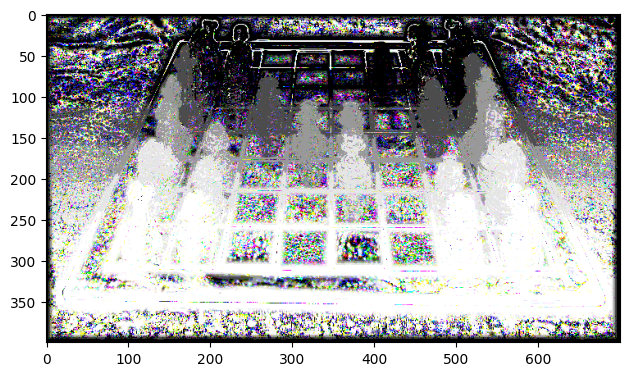

In [286]:
plt.imshow(depth_map, cmap='gray')
plt.tight_layout()
plt.savefig('separate_colors.png')

In [290]:
depths = [0.0, 0.3, 0.6, 0.9, 1.2, 1.5]
# get pixel depth map
print(temp.shape)
aperture_variance = np.var(temp[:, :, :, :, 0], axis=0)
print(aperture_variance.shape)

depth_indices = np.argmin(aperture_variance, axis=0)
h, w = depth_indices.shape
depth_map = np.zeros((h, w, 3))

for i in range(h):
    for j in range(w):
        depth_map[i, j, :] = depths[depth_indices[i, j]]

(5, 6, 400, 700, 3)
(6, 400, 700)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


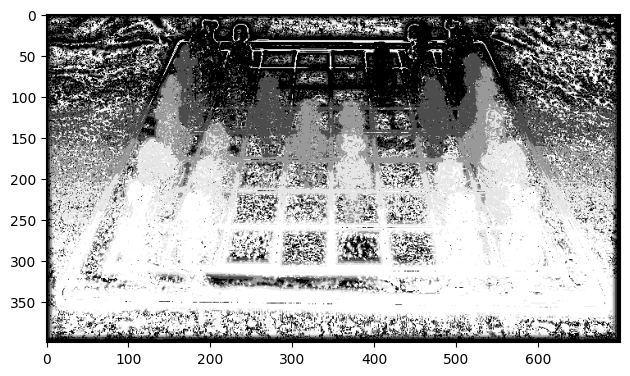

In [291]:
plt.imshow(depth_map, cmap='gray')
plt.tight_layout()
plt.savefig('same_colors.png')

In [ ]:
# vis = np.stack(new_img_A, axis=0)
# print(vis.shape)
# A = [8, 6, 4, 2, 1]
# fig = plt.figure(figsize=(18, 10))
# grid = ImageGrid(fig, 111, nrows_ncols=(1, 5), share_all=True)
# for i, (ax, im) in enumerate(zip(grid, vis)):
#     ax.imshow(im)  
#     ax.axis("off")
#     ax.set_title('aperture ' + str(A[i]))

# fig.tight_layout()
# plt.savefig('q1_last.png')
# plt.show()

# plot_2fig_difference(new_img_A[4], new_img_A[0])